<a href="https://colab.research.google.com/github/hvkchaitanya7/grp3capstoneprj/blob/main/ImageCaptionGroup3_BaseLine_resnet50.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Reference (GitHub):- https://github.com/hlamba28/Automatic-Image-Captioning/blob/master/Automatic%20Image%20Captioning.ipynb

In [2]:
!rm -rf Flickr8k_Dataset.zip
!rm -rf Flickr8k_text.zip
!wget https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip -O Flickr8k_Dataset.zip
!wget https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_text.zip -O Flickr8k_text.zip
!unzip Flickr8k_Dataset.zip
!unzip Flickr8k_text.zip

Streaming output truncated to the last 5000 lines.
  inflating: __MACOSX/Flicker8k_Dataset/._3429391520_930b153f94.jpg  
  inflating: Flicker8k_Dataset/3429465163_fb8ac7ce7f.jpg  
  inflating: __MACOSX/Flicker8k_Dataset/._3429465163_fb8ac7ce7f.jpg  
  inflating: Flicker8k_Dataset/3429581486_4556471d1a.jpg  
  inflating: __MACOSX/Flicker8k_Dataset/._3429581486_4556471d1a.jpg  
  inflating: Flicker8k_Dataset/3429641260_2f035c1813.jpg  
  inflating: __MACOSX/Flicker8k_Dataset/._3429641260_2f035c1813.jpg  
  inflating: Flicker8k_Dataset/3429956016_3c7e3096c2.jpg  
  inflating: __MACOSX/Flicker8k_Dataset/._3429956016_3c7e3096c2.jpg  
  inflating: Flicker8k_Dataset/3430100177_5864bf1e73.jpg  
  inflating: __MACOSX/Flicker8k_Dataset/._3430100177_5864bf1e73.jpg  
  inflating: Flicker8k_Dataset/3430287726_94a1825bbf.jpg  
  inflating: __MACOSX/Flicker8k_Dataset/._3430287726_94a1825bbf.jpg  
  inflating: Flicker8k_Dataset/3430526230_234b3550f6.jpg  
  inflating: __MACOSX/Flicker8k_Dataset/._3430

In [3]:

import numpy as np
from numpy import array
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import string
import os
from PIL import Image
import glob
from pickle import dump, load
from time import time
from keras.preprocessing import sequence
from keras.models import Sequential
from keras import optimizers
from keras import Input, layers
from keras.applications.inception_v3 import preprocess_input
from keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector, Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization
from keras.layers.wrappers import Bidirectional
from keras.layers.merge import add
from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing import image
from keras.models import Model
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.utils import plot_model
from nltk.translate.bleu_score import sentence_bleu
import tensorflow as tf

In [4]:
# from keras.optimizers import Adam, RMSprop
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.optimizers import Adam, RMSprop

In [5]:
# load doc into memory
def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text

filename = "/content/Flickr8k.token.txt"
# load descriptions
doc = load_doc(filename)
print(doc[:300])

1000268201_693b08cb0e.jpg#0	A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg#1	A girl going into a wooden building .
1000268201_693b08cb0e.jpg#2	A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg#3	A little girl climbing the s


In [6]:
def load_descriptions(doc):
	mapping = dict()
	# process lines
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		if len(line) < 2:
			continue
		# take the first token as the image id, the rest as the description
		image_id, image_desc = tokens[0], tokens[1:]
		# extract filename from image id
		image_id = image_id.split('.')[0]
		# convert description tokens back to string
		image_desc = ' '.join(image_desc)
		# create the list if needed
		if image_id not in mapping:
			mapping[image_id] = list()
		# store description
		mapping[image_id].append(image_desc)
	return mapping


In [7]:
# parse descriptions
descriptions = load_descriptions(doc)
print('Loaded: %d ' % len(descriptions))

Loaded: 8092 


In [8]:
descriptions

{'1000268201_693b08cb0e': ['A child in a pink dress is climbing up a set of stairs in an entry way .',
  'A girl going into a wooden building .',
  'A little girl climbing into a wooden playhouse .',
  'A little girl climbing the stairs to her playhouse .',
  'A little girl in a pink dress going into a wooden cabin .'],
 '1001773457_577c3a7d70': ['A black dog and a spotted dog are fighting',
  'A black dog and a tri-colored dog playing with each other on the road .',
  'A black dog and a white dog with brown spots are staring at each other in the street .',
  'Two dogs of different breeds looking at each other on the road .',
  'Two dogs on pavement moving toward each other .'],
 '1002674143_1b742ab4b8': ['A little girl covered in paint sits in front of a painted rainbow with her hands in a bowl .',
  'A little girl is sitting in front of a large painted rainbow .',
  'A small girl in the grass plays with fingerpaints in front of a white canvas with a rainbow on it .',
  'There is a gi

In [9]:
list(descriptions.keys())[:5]

['1000268201_693b08cb0e',
 '1001773457_577c3a7d70',
 '1002674143_1b742ab4b8',
 '1003163366_44323f5815',
 '1007129816_e794419615']

In [10]:
descriptions['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [11]:
def clean_descriptions(descriptions):
	# prepare translation table for removing punctuation
	table = str.maketrans('', '', string.punctuation)
	for key, desc_list in descriptions.items():
		for i in range(len(desc_list)):
			desc = desc_list[i]
			# tokenize
			desc = desc.split()
			# convert to lower case
			desc = [word.lower() for word in desc]
			# remove punctuation from each token
			desc = [w.translate(table) for w in desc]
			# remove hanging 's' and 'a'
			desc = [word for word in desc if len(word)>1]
			# remove tokens with numbers in them
			desc = [word for word in desc if word.isalpha()]
			# store as string
			desc_list[i] =  ' '.join(desc)

# clean descriptions
clean_descriptions(descriptions)

In [12]:
# convert the loaded descriptions into a vocabulary of words
def to_vocabulary(descriptions):
	# build a list of all description strings
	all_desc = set()
	for key in descriptions.keys():
		[all_desc.update(d.split()) for d in descriptions[key]]
	return all_desc

# summarize vocabulary
vocabulary = to_vocabulary(descriptions)
print('Original Vocabulary Size: %d' % len(vocabulary))

Original Vocabulary Size: 8763


In [13]:
# save descriptions to file, one per line
def save_descriptions(descriptions, filename):
	lines = list()
	for key, desc_list in descriptions.items():
		for desc in desc_list:
			lines.append(key + ' ' + desc)
	data = '\n'.join(lines)
	file = open(filename, 'w')
	file.write(data)
	file.close()

save_descriptions(descriptions, 'descriptions.txt')


In [14]:
# load a pre-defined list of photo identifiers
def load_set(filename):
	doc = load_doc(filename)
	dataset = list()
	# process line by line
	for line in doc.split('\n'):
		# skip empty lines
		if len(line) < 1:
			continue
		# get the image identifier
		identifier = line.split('.')[0]
		dataset.append(identifier)
	return set(dataset)

# load training dataset (6K)
filename = '/content/Flickr_8k.trainImages.txt'
train = load_set(filename)
print('Dataset: %d' % len(train))

Dataset: 6000


In [15]:
train

{'2947274789_a1a35b33c3',
 '3402638444_dab914a3de',
 '2612608861_92beaa3d0b',
 '1542033433_5453d4c466',
 '3626689571_5817f99c0e',
 '3599124739_b7e60cf477',
 '3580375310_46ec3e476c',
 '1716445442_9cf3528342',
 '470887791_86d5a08a38',
 '2303951441_3c8080907a',
 '3632842482_482f29e712',
 '479807465_cf42f39d00',
 '3533484468_0787830d49',
 '2324979199_4193ef7537',
 '2866974237_e3c1e267c0',
 '1003163366_44323f5815',
 '2065875490_a46b58c12b',
 '241345942_ea76966542',
 '3677954655_df4c0845aa',
 '1801874841_4c12055e2f',
 '272283076_2d4aa1d5cf',
 '3343106500_27176fc544',
 '3281580623_8c3ba0fdb2',
 '510791586_3913ade6a7',
 '3439560988_f001f96fc9',
 '2380464803_a64f05bfa9',
 '3690159129_93ba49ea18',
 '2571096893_694ce79768',
 '1552065993_b4dcd2eadf',
 '2657663775_bc98bf67ac',
 '2662890367_382eaf83bd',
 '3583065748_7d149a865c',
 '263233914_d25004e4cd',
 '419116771_642800891d',
 '322050103_145f7233c6',
 '2257099774_37d0d3aa9a',
 '2354792215_eef2bdc753',
 '2975018306_0e8da316f5',
 '1130017585_1a21925

In [16]:
# Below path contains all the images
images = '/content/Flicker8k_Dataset/'
# Create a list of all image names in the directory
img = glob.glob(images + '*.jpg')

In [17]:
# Below file conatains the names of images to be used in train data
train_images_file = '/content/Flickr_8k.trainImages.txt'
# Read the train image names in a set
train_images = set(open(train_images_file, 'r').read().strip().split('\n'))

# Create a list of all the training images with their full path names
train_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in train_images: # Check if the image belongs to training set
        train_img.append(i) # Add it to the list of train images

In [18]:
# Below file conatains the names of images to be used in test data
test_images_file = '/content/Flickr_8k.testImages.txt'
# Read the validation image names in a set# Read the test image names in a set
test_images = set(open(test_images_file, 'r').read().strip().split('\n'))

# Create a list of all the test images with their full path names
test_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in test_images: # Check if the image belongs to test set
        test_img.append(i) # Add it to the list of test images

In [19]:
# load clean descriptions into memory
def load_clean_descriptions(filename, dataset):
	# load document
	doc = load_doc(filename)
	descriptions = dict()
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		# split id from description
		image_id, image_desc = tokens[0], tokens[1:]
		# skip images not in the set
		if image_id in dataset:
			# create list
			if image_id not in descriptions:
				descriptions[image_id] = list()
			# wrap description in tokens
			desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
			# store
			descriptions[image_id].append(desc)
	return descriptions

# descriptions
train_descriptions = load_clean_descriptions('descriptions.txt', train)
print('Descriptions: train=%d' % len(train_descriptions))

Descriptions: train=6000


In [20]:
def preprocess(image_path):
    # Convert all the images to size 224X224 as expected by the inception v3 model
    img = image.load_img(image_path, target_size=(224, 224,3))
    # Convert PIL image to numpy array of 3-dimensions
    x = image.img_to_array(img)
    #print(x.shape())
    # Add one more dimension
    x = np.expand_dims(x, axis=0)
    # preprocess the images using preprocess_input() from inception module
    #x = preprocess_input(x)
    return x

In [21]:
# Load the ResNet v3 model
model = ResNet50(include_top=True,weights='imagenet',input_shape=(224, 224,3),pooling="avg")

102981632/102967424 [==============================] - 2s 0us/step


In [22]:
model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [23]:
# Create a new model, by removing the last layer (output layer) from the inception v3
model_new = Model(model.input, model.layers[-2].output)

In [24]:
model_new.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [25]:
# Function to encode a given image into a vector of size (2048, )
def encode(image):
    image = preprocess(image) # preprocess the image
    fea_vec = model_new.predict(image) # Get the encoding vector for the image
    fea_vec = np.reshape(fea_vec, fea_vec.shape[1]) # reshape from (1, 2048) to (2048, )
    return fea_vec

In [26]:
# Call the funtion to encode all the train images
# This will take a while on CPU - Execute this only once
start = time()
encoding_train = {}
for img in train_img:
    encoding_train[img[len(images):]] = encode(img)
print("Time taken in seconds =", time()-start)

Time taken in seconds = 335.6347987651825


In [27]:
pkl_train_file="/content/Pickle_ResNet/encoded_train_images.pkl"

In [28]:
# Save the bottleneck train features to disk
with open(pkl_train_file, "wb") as encoded_pickle:
    dump(encoding_train, encoded_pickle)

    # /content/sample_data/Pickle/encoded_train_images.pkl

In [29]:
# Call the funtion to encode all the test images - Execute this only once
start = time()
encoding_test = {}
for img in test_img:
    encoding_test[img[len(images):]] = encode(img)
print("Time taken in seconds =", time()-start)

Time taken in seconds = 54.032933950424194


In [30]:
pkl_test_file = "/content/Pickle_ResNet/encoded_test_images.pkl"

In [31]:

# Save the bottleneck test features to disk
with open(pkl_test_file, "wb") as encoded_pickle:
    dump(encoding_test, encoded_pickle)

In [32]:
train_features = load(open(pkl_train_file, "rb"))
print('Photos: train=%d' % len(train_features))

Photos: train=6000


In [33]:
# Create a list of all the training captions
all_train_captions = []
for key, val in train_descriptions.items():
    for cap in val:
        all_train_captions.append(cap)
len(all_train_captions)

30000

In [34]:
# Consider only words which occur at least 10 times in the corpus
word_count_threshold = 10
word_counts = {}
nsents = 0
for sent in all_train_captions:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1

vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]
print('preprocessed words %d -> %d' % (len(word_counts), len(vocab)))

preprocessed words 7578 -> 1651


In [35]:
ixtoword = {}
wordtoix = {}

ix = 1
for w in vocab:
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1

In [36]:
vocab_size = len(ixtoword) + 1 # one for appended 0's
vocab_size

1652

In [37]:
# convert a dictionary of clean descriptions to a list of descriptions
def to_lines(descriptions):
	all_desc = list()
	for key in descriptions.keys():
		[all_desc.append(d) for d in descriptions[key]]
	return all_desc

# calculate the length of the description with the most words
def max_length(descriptions):
	lines = to_lines(descriptions)
	return max(len(d.split()) for d in lines)

# determine the maximum sequence length
max_length = max_length(train_descriptions)
print('Description Length: %d' % max_length)

Description Length: 34


In [38]:
# data generator, intended to be used in a call to model.fit_generator()
def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch):
    X1, X2, y = list(), list(), list()
    n=0
    # loop for ever over images
    while 1:
        for key, desc_list in descriptions.items():
            n+=1
            # retrieve the photo feature
            photo = photos[key+'.jpg']
            for desc in desc_list:
                # encode the sequence
                seq = [wordtoix[word] for word in desc.split(' ') if word in wordtoix]
                # split one sequence into multiple X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pair
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    # store
                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)
            # yield the batch data
            if n==num_photos_per_batch:
                yield [[array(X1), array(X2)], array(y)]
                X1, X2, y = list(), list(), list()
                n=0

In [39]:
!wget http://nlp.stanford.edu/data/glove.6B.zip

--2022-07-09 15:39:12--  http://nlp.stanford.edu/data/glove.6B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://nlp.stanford.edu/data/glove.6B.zip [following]
--2022-07-09 15:39:12--  https://nlp.stanford.edu/data/glove.6B.zip
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip [following]
--2022-07-09 15:39:12--  https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘glove.6B.zip’

glov

In [40]:
!unzip glove*.zip

Archive:  glove.6B.zip
  inflating: glove.6B.50d.txt        
  inflating: glove.6B.100d.txt       
  inflating: glove.6B.200d.txt       
  inflating: glove.6B.300d.txt       


In [41]:
!wget http://nlp.stanford.edu/data/glove.6B.200d.zip

--2022-07-09 15:42:13--  http://nlp.stanford.edu/data/glove.6B.200d.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://nlp.stanford.edu/data/glove.6B.200d.zip [following]
--2022-07-09 15:42:14--  https://nlp.stanford.edu/data/glove.6B.200d.zip
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://downloads.cs.stanford.edu/nlp/data/glove.6B.200d.zip [following]
--2022-07-09 15:42:14--  https://downloads.cs.stanford.edu/nlp/data/glove.6B.200d.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2022-07-09 15:42:15 ERROR 404: Not Found.


In [42]:

# Load Glove vectors
glove_dir = '/content/'
embeddings_index = {} # empty dictionary
f = open(os.path.join(glove_dir, 'glove.6B.200d.txt'), encoding="utf-8")

for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [43]:
vocab_size

1652

In [44]:
embedding_dim = 200

# Get 200-dim dense vector for each of the 10000 words in out vocabulary
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in wordtoix.items():
    #if i < max_words:
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in the embedding index will be all zeros
        embedding_matrix[i] = embedding_vector

In [45]:
embedding_matrix.shape

(1652, 200)

In [46]:
embedding_matrix[1650,0:50]

array([ 0.20298   , -0.10048   , -0.33627   , -0.72679001,  0.23146001,
        0.22077   ,  0.42952001, -0.60758001,  0.85202003, -0.85326999,
       -0.88313001, -0.39104   ,  0.28290999, -0.23973   ,  0.35580999,
       -0.22188   , -0.44758001,  0.33155999, -0.14907999,  0.26605999,
        0.37055001,  0.076139  , -0.31450999, -0.68892002,  0.92940003,
        0.59457999,  0.32692   , -0.14501999, -0.13399   , -0.26473999,
        0.43072   , -0.06878   , -0.66360998, -0.37437001, -0.63537002,
        0.95183003, -0.48716   , -0.24009   ,  0.21712001,  0.78609002,
        0.52569002, -0.56200999,  0.20886999, -0.35106999, -0.35617   ,
       -0.52287   , -0.66702998,  0.59358001, -0.19891   ,  0.60021001])

In [47]:
max_length

34

In [48]:
inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)
se2 = Dropout(0.5)(se1)
se3 = LSTM(256)(se2)
decoder1 = add([fe2, se3])
print(decoder1.shape)
decoder2 = Dense(256, activation='relu')(decoder1)
print(decoder2.shape)
outputs = Dense(vocab_size, activation='softmax')(decoder2)
model = Model(inputs=[inputs1, inputs2], outputs=outputs)

(None, 256)
(None, 256)


In [49]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 34)]         0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 2048)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, 34, 200)      330400      ['input_3[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 2048)         0           ['input_2[0][0]']                
                                                                                            

In [50]:
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False

In [51]:
model.compile(loss='categorical_crossentropy', optimizer='adam')

In [52]:
epochs = 15
number_pics_per_bath = 20
steps = len(train_descriptions)//number_pics_per_bath

In [53]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model.save('./model_weights/model_' + str(i) + '.h5')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  This is separate from the ipykernel package so we can avoid doing imports until


300/300 [==============================] - 38s 127ms/step - loss: 2.7024


In [54]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model.save('./model_weights/model_' + str(i) + '.h5')

  1/300 [..............................] - ETA: 39s - loss: 2.5312

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  This is separate from the ipykernel package so we can avoid doing imports until


300/300 [==============================] - 39s 130ms/step - loss: 2.4297


In [55]:
model.optimizer.lr = 0.0001
epochs = 15
number_pics_per_bath = 20
steps = len(train_descriptions)//number_pics_per_bath

In [56]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    #model.save('./model_weights/model_' + str(i) + '.h5')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  This is separate from the ipykernel package so we can avoid doing imports until


300/300 [==============================] - 39s 128ms/step - loss: 2.3129


In [65]:
model.save_weights('./model_weights/Resnet_model_45.h5')

In [66]:
model.load_weights('./model_weights/Resnet_model_45.h5')

In [59]:
images = '/content/Flicker8k_Dataset/'

In [60]:
with open(pkl_test_file, "rb") as encoded_pickle:
    encoding_test = load(encoded_pickle)

In [61]:
def greedySearch(photo):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

In [71]:
from nltk.translate.bleu_score import sentence_bleu
import tensorflow as tf
def get_bleuscore(pred_desc, image_name):
    cand_desc = pred_desc.split()
    #print("blue score desc", cand_desc)
    img_name = image_name.split(".jpg")[0]
    refer_desc = descriptions[img_name]
    refer_list = []
    for s in refer_desc:
         s = s.split()
         refer_list.append(s)
    #print(s)
    print("Expert Caption:",refer_desc)
    #print (refer_list)
    score = sentence_bleu(refer_list,cand_desc,weights=(0, 1, 0))
    #print(score)
    return(score)

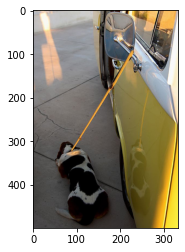

Expert Caption: ['basset hound is leashed to the rearview mirror of yellow and white vehicle', 'black and white dog tied to yellow and white van', 'dog lying down tethered to the side mirror of yellow vw bus', 'dog with black white and brown coloring is leashed up to mirror', 'the black and white dog is tethered next to yellow car']
Blue score 0.44741965840718484
caption: black and white dog is jumping over an obstacle


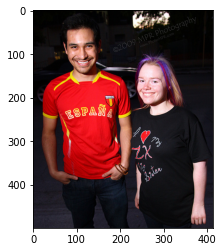

Expert Caption: ['man in red shirt standing next to woman in black shirt with car in the background', 'man in red shirt that says espana and girl with purple streaks in her hair are smiling', 'man with red spain shirt and woman with purple streaks in her hair', 'the man and lady pose for picture', 'the man is wearing red shirt while the woman standing with him has purple streaks in her hair']
Blue score 2.2250738585072626e-308
caption: two men in uniform are standing together


/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.7/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


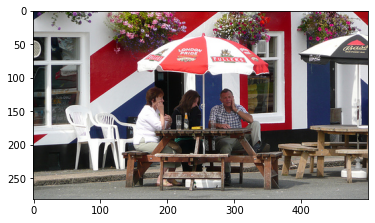

Expert Caption: ['couple of people sit outdoors at table with an umbrella and talk', 'three people are sitting at an outside picnic bench with an umbrella', 'three people sit at an outdoor cafe', 'three people sit at an outdoor table in front of building painted like the union jack', 'three people sit at picnic table outside of building painted like union jack']
Blue score 0.16666666666666669
caption: woman in black shirt and black pants is hula in front of crowd


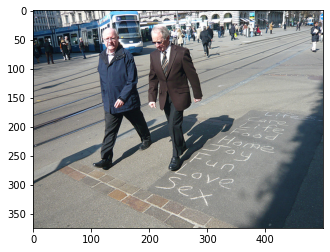

Expert Caption: ['two elderly people walk down city sidewalk by words written in chalk', 'two men walk along busy city street with words printed on the sidewalk', 'two men walk through city with words on the street', 'two older men in business attire are walking in city text graffiti is visible on the sidewalk', 'two people walk down city street that has writing on it']
Blue score 0.22370982920359242
caption: man in black shirt is standing on the sidewalk


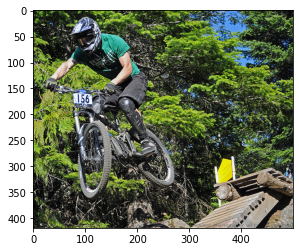

Expert Caption: ['bicyclist wearing helment riding down steep ramp', 'bike rider catches air near ramp', 'bmx rider in midair', 'man wearing green shirt is jumping his bicycle off ramp', 'cyclist in green shirt doing trick on wooden ramp']
Blue score 0.5
caption: man in green shirt is jumping over green bicycle


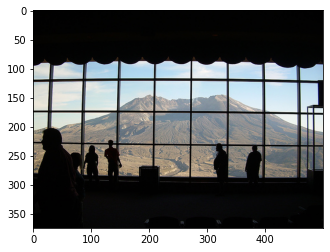

Expert Caption: ['group of people inside building that overlooks large mountain', 'large window with mountain range while onlookers stand in front', 'people look out the window at mountains', 'people stand and look out the window to view the mountain', 'sillhouttes of people in front of mountain and in front of window']
Blue score 0.25
caption: two people sit on bench in front of railing


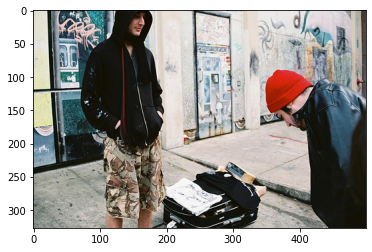

Expert Caption: ['man in black hoodie watching man in red cap', 'man standing on street with suitcase in front of him while another man bends down to look at what is displayed on top of it', 'man wearing red hat looks down as another man watches', 'two men are standing on the street covered in graffiti', 'two people on street one person looking down']
Blue score 0.43343894987509085
caption: two men are sitting on the sidewalk


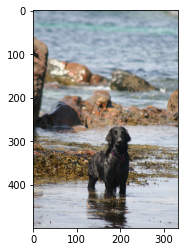

Expert Caption: ['black dog in water', 'black dog standing in shallow area of water on rocky beach', 'dog stands in tide pool', 'small black dog in the ocean with some rocks in the background', 'small black dog plays in the water']
Blue score 0.3333333333333333
caption: black dog is running through the water


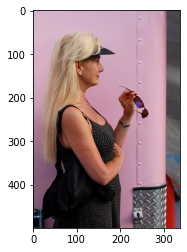

Expert Caption: ['large woman puts her sunglasses on', 'woman in black dress holding sunglasses', 'woman wearing black and white outfit while holding her sunglasses', 'the lady is holding her glasses', 'the woman with blond hair holds her sunglasses']
Blue score 2.2250738585072626e-308
caption: girl in pink dress is standing on the street


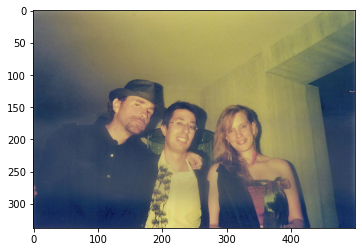

Expert Caption: ['three people stand by doorway posing for photograph', 'two men and woman pose for picture', 'two men and woman smile at the camera', 'two men and woman standing near doorway', 'two men and woman with their arms around each other']
Blue score 0.16666666666666669
caption: two girls touch each other while third


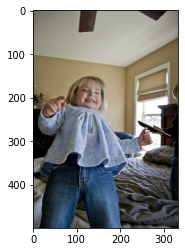

Expert Caption: ['little girl is falling backwards onto bed', 'young girl jumps on bed', 'the young girl is happily standing inside the house', 'two children play on the bed with remote control', 'young blond girl in blue jeans falls back on bed while another child looks on']
Blue score 0.25
caption: two girls in blue shirts are sitting on bed


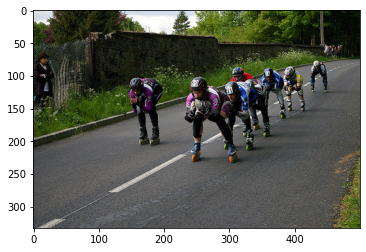

Expert Caption: ['group of rollerbladers is lined up on the street', 'group of rollerblading on sloping road', 'line of rollerbladers crouch down aerodynamically', 'many people are rollerblading down the street', 'rollerbladers roll in formation down hill']
Blue score 0.2
caption: two people are walking down road


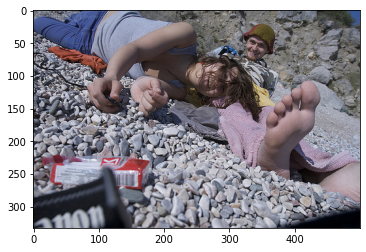

Expert Caption: ['laughing woman leans on the legs of sitting man while lying on bed of pebbles', 'woman and barefoot man lay down on rocky terrain', 'laying on stones girl with messy hair has her head on the boy laying next to her', 'the two people are lying in gray rocks', 'young man and woman stretch out on stones packages in foreground']
Blue score 2.2250738585072626e-308
caption: two young girls are playing with water fountain


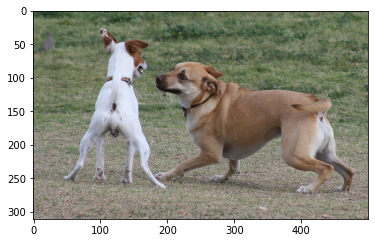

Expert Caption: ['big brown dog chases smaller white dog around in the grass', 'terrier dog and mixed breed dog playing', 'white dog and brown dog fighting', 'the white and brown dog are playing in the dead grass', 'two dogs paying attention to each other']
Blue score 0.5
caption: two dogs are playing with ball in the grass


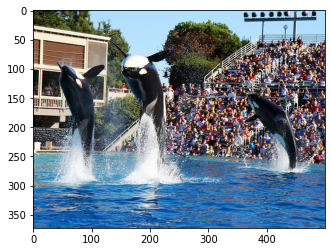

Expert Caption: ['killer whales perform for crowd', 'three dolphins are jumping out of pool in front of crowd of people', 'three orca whales jump in pool at seaworld', 'three whales are jumping into the air at the same time in front of very large crowd', 'three whales are jumping in the air while people watch']
Blue score 0.2
caption: man is standing in front of fountain with his arms raised


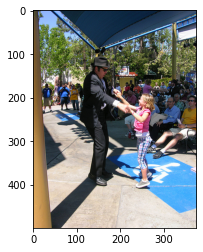

Expert Caption: ['man and girl stand in front of large crowd', 'man dances with girl', 'man in suit dances with young girl in front of an audience', 'man wearing black dances with young girl wearing pink shirt', 'the man wearing the blues brothers suit is dancing with the little girl in the pink top']
Blue score 0.10000000000000002
caption: man in camouflage pants and jeans is skateboarding on the street


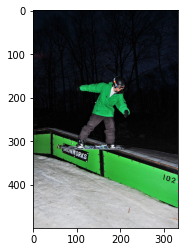

Expert Caption: ['helmeted boy flies through the air on snowboard', 'snowboarder balancing on wall', 'snowboarder in green grinds along the edge of rail at night', 'snowboarder wearing green jacket jumping green rainling', 'snowboarder wearing green jacket jumps above low gate']
Blue score 2.0133300850710214e-308
caption: man in black shirt and jeans is jumping on trampoline


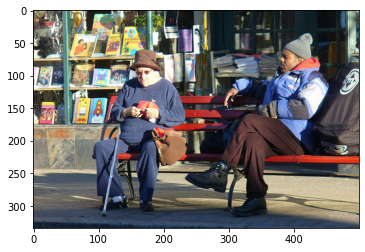

Expert Caption: ['an older man is sitting on red bench with younger man', 'an older person is sitting on red bench next to black man with children bookstore behind them both', 'person sits on red bench to eat while another watches', 'two men sit on bench', 'two people sitting on red bench in front of books']
Blue score 0.18181818181818182
caption: man in grey shirt and jeans is standing in front of crowd


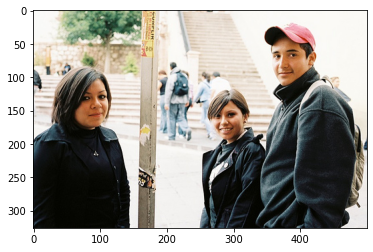

Expert Caption: ['man and two women standing by wood pole in front of steps', 'three students standing together in front of stairway', 'three young adults look towards the camera in school setting', 'two women and man are all wearing black jackets and smiling', 'two women and man smile for the camera']
Blue score 2.2250738585072626e-308
caption: man in blue jacket and hat stands next to woman in white jacket


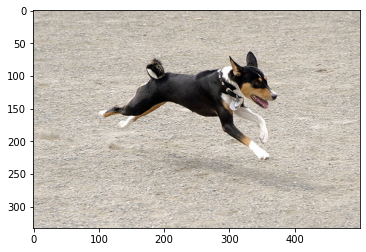

Expert Caption: ['brown black and white dog runs along on the gravel', 'dog runs', 'little dog running on sand', 'the brown white and black dog runs on gravel surface', 'the dog is running across the gravel']
Blue score 2.2250738585072626e-308
caption: two dogs are playing with red ball in the snow


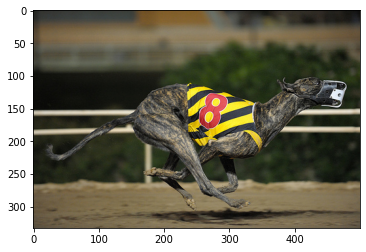

Expert Caption: ['dog wearing number running in race', 'greyhound dog wearing yellow and black shirt runs along dirt racetrack', 'greyhound runs in race bee striped jacket number eight', 'grey dog with muzzle and with the yellow striped identification is running', 'racedog has the number']
Blue score 0.11111111111111109
caption: the black greyhound is wearing red shirt and black jacket


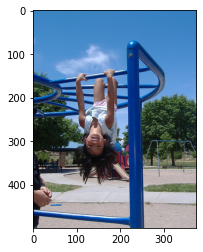

Expert Caption: ['child playing on the monkey bars at playground with an adult present', 'girl hangs on the bars', 'kid hangs upside down on the monkey bars at playground', 'young children hanging upside at the playground', 'girl hanging upside down on blue monkey bars']
Blue score 2.2250738585072626e-308
caption: woman in yellow shirt is rollerblading on playground


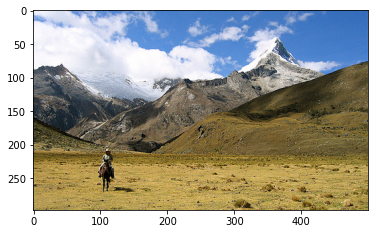

Expert Caption: ['man on horseback on grassy field in front of mountains', 'person on brown horse in prairie in front of tall mountains', 'person riding horse with mountain range in the far background', 'rider on horse in front of mountain range', 'distant horse rider on plain in the middle of brown mountains']
Blue score 2.2250738585072626e-308
caption: person is sitting on top of cliff overlooking the mountains


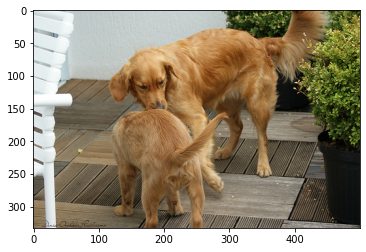

Expert Caption: ['large dog sniffing smaller dog outside', 'two blond dogs are standing together on patio', 'two dogs are standing together on patio', 'two golden dogs are standing on wooden patio', 'two golden dogs on wood deck']
Blue score 0.16666666666666669
caption: dog sniffing the cheek of another dog


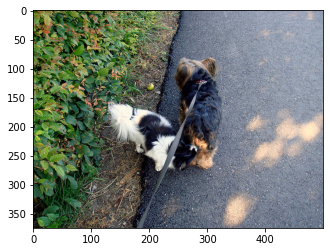

Expert Caption: ['brown and black dog on leash is sniffed by black and white dog', 'dog on leash walks on the sidewalk while another dog follows', 'small dog on leash is being smelled by another animal', 'the black and white dog is sniffing the butt of the brown dog that is on leash', 'two small dogs one blackandwhite and one brownandblack walk down the street']
Blue score 1.4495000173229606e-308
caption: two dogs are playing in the yard


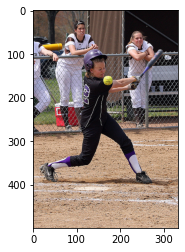

Expert Caption: ['child wearing black and purple playing baseball', 'girl closes her eyes as she swings the bat and misses the softball', 'girl playing softball takes strike', 'girl playing softball taking swing', 'softball player swinging at softball and missing it']
Blue score 2.0471667756573244e-308
caption: man in blue shirt and blue jeans hits soccer ball with bat


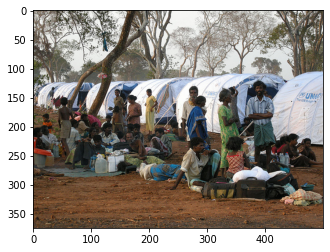

Expert Caption: ['crowd of dark skinned people standing outside of white tents', 'group of people stand and sit on the dirt near line of several white tents', 'group of refugees and sitting next to their tents', 'people are gathered by tree beside line of white tents', 'some people sit and some stand in group of families before background of white tents with un markings']
Blue score 0.4444444444444444
caption: group of people sit on bench in front of trees


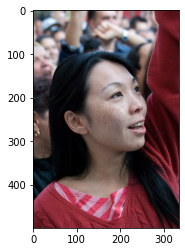

Expert Caption: ['closeup picture of girl with long black hair and one hand raised in the air', 'lady with dark hair dressed in red clothing with left arm in the air', 'woman in red shirt with her arm raised', 'woman in red sweater raises her hand in crowd', 'woman raises her hand']
Blue score 0.2857142857142857
caption: young girl with brown hair and sunglasses smiles


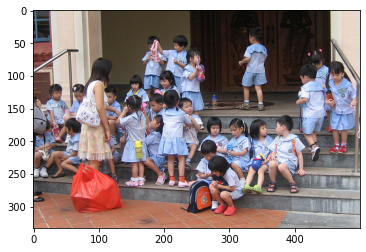

Expert Caption: ['bunch of asian children on steps', 'large group of asian children sit on or stand near steps', 'group of children in blue uniforms sitting on steps', 'little children in school uniforms congregate on the steps', 'many school children dressed in the same uniform are sitting on stairs']
Blue score 0.3782129582505409
caption: group of children are playing in the street


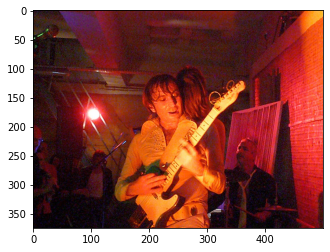

Expert Caption: ['man in fancy clothing plays guitar on stage', 'man playing guitar under the lights with other people in the background', 'woman plays guitar by round light', 'man playing guitar in dark room', 'the man played guitar in the band']
Blue score 0.20468268826949548
caption: man sings while playing guitar


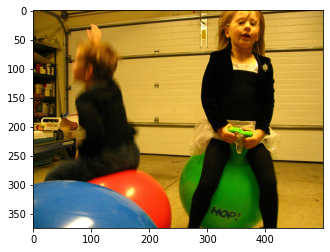

Expert Caption: ['boy and girl bouncing on ball', 'the children are wearing black tights while hopping', 'two children dressed in black bounce on red and green bouncy balls in garage', 'two kids are bouncing on colorful balls', 'two young children bouncing on balls']
Blue score 0.2
caption: two children are sitting on the floor in front of fish


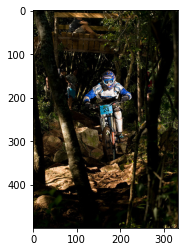

Expert Caption: ['dirt biker in the forest', 'dirt biker rides his motocycle through the woods', 'motocross bike is being ridden along woodland path', 'motorcyclist navigates forest trail', 'person rides motorbike on dirt path surrounded by trees']
Blue score 2.2250738585072626e-308
caption: man in black and black is performing trick on bicycle


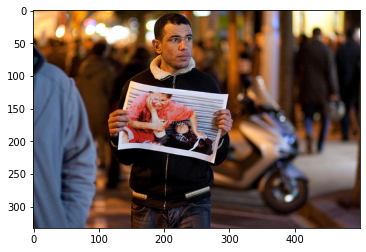

Expert Caption: ['man displays photograph', 'man holding up picture of two people suffering', 'man is holding up small poster with two people in it', 'man is standing in front of motorscooter holding up picture', 'man is walking down the street holding up picture']
Blue score 0.08333333333333333
caption: man in plaid shirt and cap is standing on sidewalk with many people


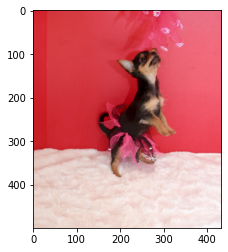

Expert Caption: ['small black dog is standing on two feet and wearing pink tutu', 'small dog in costume stands on hind legs to reach dangling flowers', 'the dog is jumping up beside red wall', 'the small brown and black down is wearing pink tutu', 'the small dog wearing tutu stands on its hind legs']
Blue score 2.2250738585072626e-308
caption: little girl in pink shirt is playing with her toy


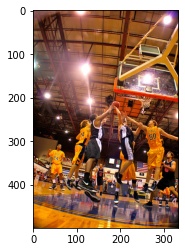

Expert Caption: ['basketball game', 'group of athletes playing basketball game', 'group of basketball players jump in the air for the ball', 'basketball players participate in game', 'black and yellow teams are trying to get the basketball in the goal']
Blue score 0.16666666666666669
caption: the man is playing with the ball


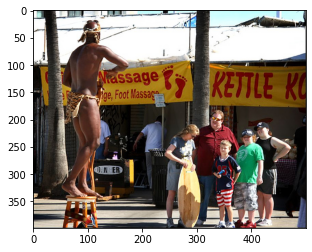

Expert Caption: ['family of five is watching performer standing on stepstool', 'group of people watch man standing on stool dressed in thong', 'halfnaked performer is performing for small crowd outside', 'man in small bathing suit standing on stool at tourist location', 'mostly nude man standing on stool while family of look at him questioningly']
Blue score 0.2857142857142857
caption: group of people are standing around on sidewalk


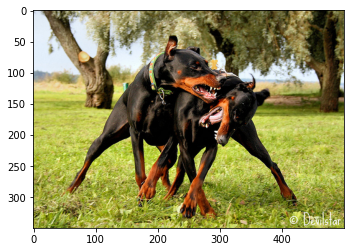

Expert Caption: ['two dobermans fighting or playing together on lawn', 'two dogs fight on the grass', 'two dogs play together', 'two dogs wrestle in the grass', 'two large dogs are fighting with teeth bared near some trees']
Blue score 0.5
caption: two dogs are running through the grass


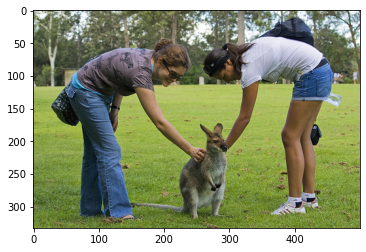

Expert Caption: ['woman in jeans and woman in shorts are petting baby kangaroo', 'two girls pet small kangaroo in grassy field', 'two women bend over to touch small kangaroo', 'two women pet baby kangaroo in the park', 'two women pet kangaroo in park']
Blue score 0.2857142857142857
caption: man and woman are both in the grass


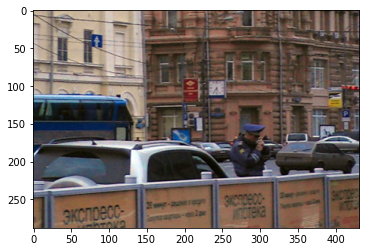

Expert Caption: ['cop stands in front of car on busy street', 'man walks in the city', 'an officer stands next to car on city street', 'policeman stands in front of an suv', 'police officer is lighting cigarette']
Blue score 2.2250738585072626e-308
caption: two people are sitting on the deck of bridge


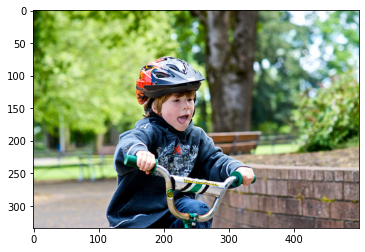

Expert Caption: ['boy with blue helmet is riding bike', 'young boy has his mouth open as he rides his bike outdoors past stone wall', 'young boy is riding bike', 'young boy wearing helmet and riding bike in park', 'the boy with the red and blue helmet rides his bicycle']
Blue score 0.3333333333333333
caption: man in blue shirt and blue jeans is riding bike


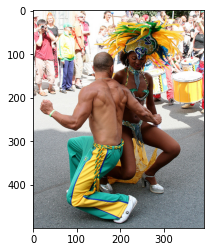

Expert Caption: ['man and woman in festive costumes dancing', 'man and woman with feathers on her head dance', 'man and woman wearing decorative costumes and dancing in crowd of onlookers', 'one performer wearing feathered headdress dancing with another performer in the streets', 'two people are dancing with drums on the right and crowd behind them']
Blue score 2.2250738585072626e-308
caption: man in blue shirt and jeans is standing in front of fountain


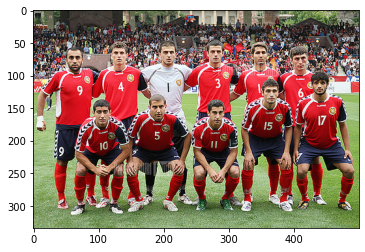

Expert Caption: ['group of players on team are posing together', 'soccer team poses for picture', 'soccer team wearing red posing together', 'sports team poses on the field', 'sports team poses on field with crowd in the background']
Blue score 0.14285714285714285
caption: group of rugby players in red jerseys run


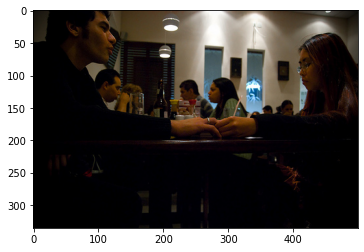

Expert Caption: ['couple in restaurant are holding hands', 'couple holding hands across table', 'couple is sitting in restaurant holding hands', 'dimly lit room with several individuals including young man and woman holding hands across table', 'man and woman are sitting at restaurant table holding hands']
Blue score 2.2250738585072626e-308
caption: man speaking at table in food


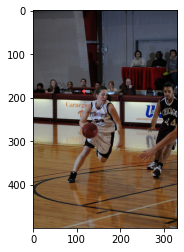

Expert Caption: ['basketball player wearing black and white uniform dribbles the ball', 'at women basketball game white skinned woman dribbles against the chicago defense', 'basketball players in action', 'the basketball player in white is dribbling the ball towards the player in black', 'woman in white dribbling basketball']
Blue score 0.18181818181818182
caption: man in white shirt and white shorts is kick in the air


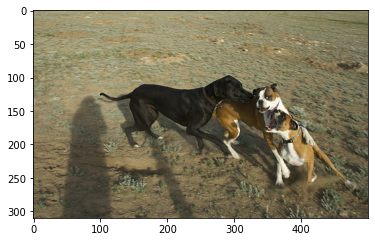

Expert Caption: ['black dog and two brown and white dogs are romping in the mud', 'the three dogs play in the sand', 'three dogs are playing in field', 'three dogs are playing rough in sandy field', 'three dogs chase and wrestle together on dirt field']
Blue score 0.8333333333333334
caption: two dogs are playing in the sand


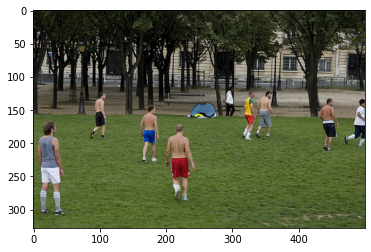

Expert Caption: ['group of men are standing around during sports game in park', 'men in the park', 'men playing soccer in field', 'men standing on grass field with trees in the background', 'nine men are playing game in the park shirts versus skins']
Blue score 0.33556474380538864
caption: group of people are standing in field of grass


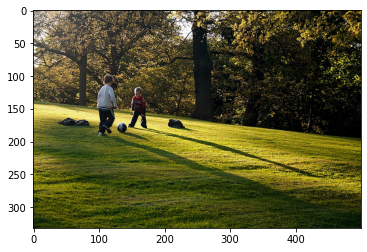

Expert Caption: ['two boys in field kicking soccer ball', 'two children are playing with soccer ball on grass', 'two children playing with ball on the grass', 'two children play soccer in the park', 'two little boys are playing outside with their soccer ball on the green grass']
Blue score 2.2250738585072626e-308
caption: man in black shirt and jeans is walking down paved path


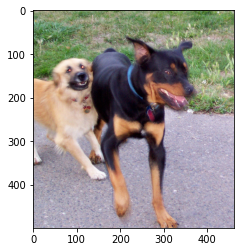

Expert Caption: ['black and brown dog with tan dog on cement path in front of grass', 'black dog and yellow dog are walking on asphalt next to field of grass', 'blurry photo of two dogs', 'white dog is running behind black dog on paved path by some grass', 'two dogs walk along path beside the grass']
Blue score 0.14447964995836363
caption: two dogs are playing with red ball


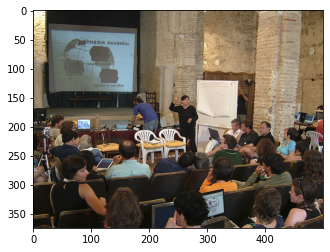

Expert Caption: ['class full of students', 'classroom of students watching presentation', 'conference is being held that involves laptops and big screen presentations', 'group of people are at conference watching slideshow', 'man is giving presentation in front of lot of people']
Blue score 0.2727272727272727
caption: group of people are sitting around table with their hands to cage


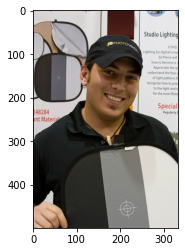

Expert Caption: ['man in black cap and shirt smiling while holding white grey and black rectangular object', 'man smiles and poses with product he appears to be trying to sell', 'man wearing black shirt and baseball cap smiling', 'the man is wearing black shirt and hat and smiling', 'there is man with black shirt and black hat smiling']
Blue score 0.4
caption: man wearing black shirt and glasses stands in front of sign


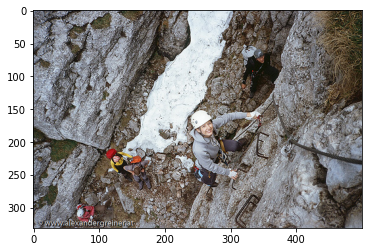

Expert Caption: ['woman wearing white helmeted looking up as she is calming huge rock wall', 'woman is climbing up steep mountain over water', 'people mountain climbing', 'people rock crawl up steep obstacle', 'these helmeted people are rock climbing outdoors']
Blue score 2.2250738585072626e-308
caption: man climbing rock face


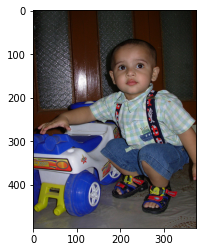

Expert Caption: ['boy plays with car', 'boy playing with truck', 'the baby in suspenders sits by toy', 'the little boy with the big brown eyes is touching the little car', 'the toddler in suspenders plays with truck']
Blue score 0.08333333333333333
caption: baby in blue and blue outfit is sitting on blue and white toy


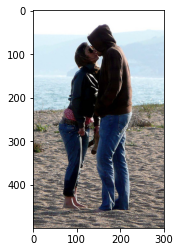

Expert Caption: ['couple dressed in hoodies kissing on the beach', 'man and woman share kiss on the beach', 'man with brown hooded jacket is kissing girl with sunglasses', 'there is couple kissing on the beach', 'two people kiss on the beach']
Blue score 2.2250738585072626e-308
caption: man in blue shirt and jeans stands on rock overlooking lake


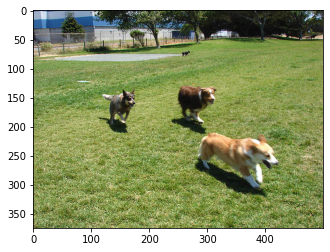

Expert Caption: ['the three dogs ran in the yard', 'three dogs are running across the grass near to blue industrial building', 'three dogs are running in field', 'three dogs run away from patch of nongrassy surface leaving one another dog behind', 'three dogs that are different shades of brown and white are running in field']
Blue score 0.20468268826949548
caption: two dogs are playing soccer


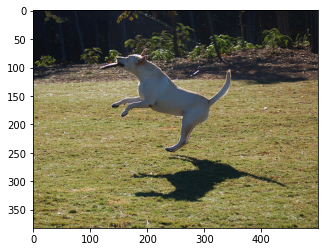

Expert Caption: ['dog is jumping to catch frisbee and casts perfect shadow', 'dog jumps and catches frisbee in the grass', 'dog jumps and catches toy', 'white dog leaps to catch an object', 'yellow lab jumping up to catch toy']
Blue score 0.4
caption: dog catching frisbee in the air


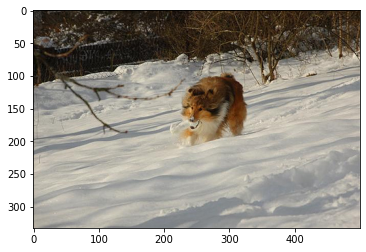

Expert Caption: ['brown dog carries an object in its mouth on snowy hillside', 'collie running through the snow', 'sheltie dog carries whitecolored toy in its mouth as it walks across the snow', 'dog with toy in the snow', 'the dog wades through deep snow with something in its mouth']
Blue score 0.6
caption: dog is running through the snow


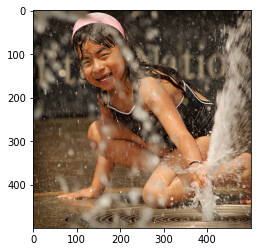

Expert Caption: ['girl with black swimsuit plays in the sprinkler', 'young girl is playing in fountain of water', 'young girl plays in fountain water', 'little girl crouches to splash fountain water', 'there is young girl in bathing suit playing with water shooting out of the ground']
Blue score 2.2250738585072626e-308
caption: boy in blue shirt and goggles is wearing red life jacket


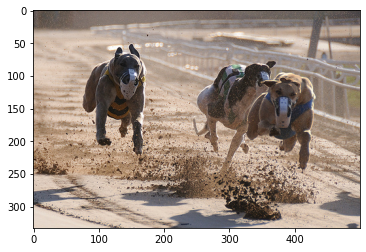

Expert Caption: ['the greyhounds are running quickly in this race', 'three dogs racing on racetrack', 'three dogs running on racing track', 'three greyhounds racing on track', 'three racing dogs with masks on their mouths']
Blue score 0.16666666666666669
caption: two dogs are running in the snow


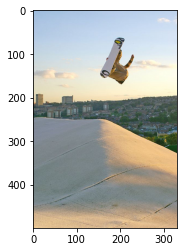

Expert Caption: ['snowboarder is doing flip over mound of snow', 'snowboarder is in midair doing trick', 'somebody in the air on board', 'someone on rooftop jumping on some sort of board caught in midair', 'there is person on snowboard up high in the air']
Blue score 0.18393972058572117
caption: skateboarder in midair


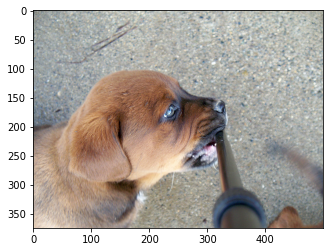

Expert Caption: ['brown puppy is gnawing in metallic post that is stuck into the ground', 'dog is chewing on metal pole', 'puppy mouthing pole on the ground', 'brown dog chewing on brown walking cane', 'brown puppy biting pole']
Blue score 0.2
caption: dog is looking at the camera


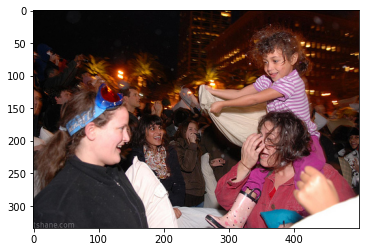

Expert Caption: ['crowd of people in the street at night', 'young girl sits atop lady shoulders as they revel with the celebrating crowd', 'two woman and child look at each other while night party scene goes on behind them', 'two women and child celebrating at nighttime party', 'two women and one young girl are together in crowded area']
Blue score 0.1336438550045168
caption: girl in pink dress is playing with her head in front of crowd of people


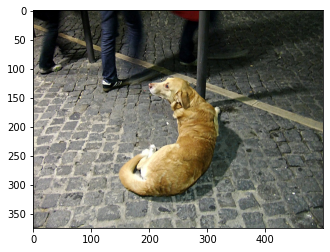

Expert Caption: ['brown dog is sitting on cobbled pavement', 'brown god relaxes on brick sidewalk', 'dog lies down on cobblestone street', 'yellow dog is lying near where people are walking', 'the dog is lying on the cobblestone street']
Blue score 0.12500000000000003
caption: dog is jumping over red and white soccer ball


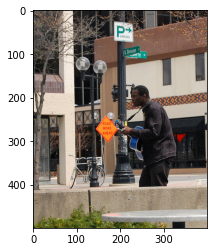

Expert Caption: ['dark skinned man plays blue guitar on the street', 'man playing his guitar on the street surrounded by buildings and street lights', 'man plays blue guitar on the an empty urban street', 'man walking the streets while playing the guitar', 'the man plays his guitar on the local streets']
Blue score 2.0471667756573244e-308
caption: man in black shirt and jeans is sitting on bench reading book


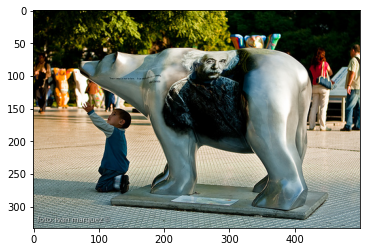

Expert Caption: ['boy is kneeling under statue of bear that has painting of man on its back', 'boy sits under bear with einstein picture on it', 'picture of albert einstein on white bear statue with little boy standing under the bear statue face', 'portrait of einstein is painted on statue of polar bear', 'painting of albert einstein on bear with child reaching up']
Blue score 2.2250738585072626e-308
caption: two dogs are looking at the same of an ice cream cone


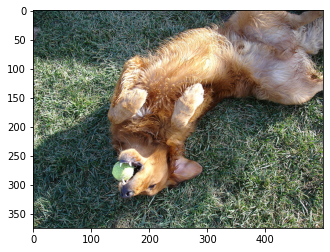

Expert Caption: ['brown dog is laying on its back on the grass with ball in its mouth', 'brown dog lies on its back in the grass holding ball in its mouth', 'brown dog with tennis ball its mouth rolling on its back on grassy surface', 'dog lays on his back with favorite tennis ball in his mouth', 'tan dog plays with tennis ball while rolling around in the grass']
Blue score 0.14715177646857694
caption: brown dog is playing with toy


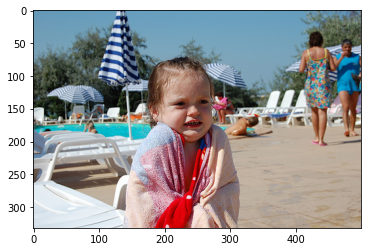

Expert Caption: ['girl is cold after coming out of the pool and is covered by towel', 'little girl is covered in towel at swimming pool', 'toddler is with wet hair stands by swimming pool wrapped in towel', 'wet child is shivering in towel in front of pool', 'wet child shivers under towel at pool']
Blue score 2.2250738585072626e-308
caption: woman in blue shirt and blue headscarf stands next to woman in blue shirt and sunglasses


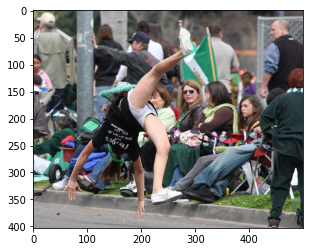

Expert Caption: ['girl does cartwheel in the street while people watch from the sidewalk', 'girl doing cartwheel in front of crowd', 'woman is doing backwards flip in front of crowd of other people sitting on the sidewalk', 'someone in shorts is somersaulting in front of crowd', 'the person in the black shirt performed stunt in the street while the crowd watched']
Blue score 2.2250738585072626e-308
caption: group of people are riding bicycles on pavement


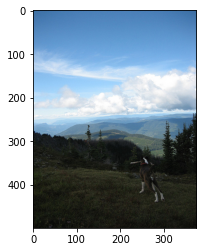

Expert Caption: ['black and white dog with stick in his mouth standing on hill', 'dog is playing catch on the grassy plain', 'dog stands at the top of mountain and looks on', 'dog stands on hill looking towards the valley with stick in its mouth', 'brown dog holding stick in mouth']
Blue score 0.2
caption: dog is running through the snow


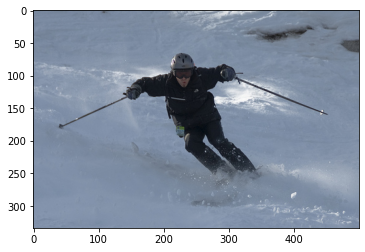

Expert Caption: ['man skiing down hill', 'man skis down snowy hill', 'person skis downhill', 'skier dressed in black speeds down the mountain', 'closeup of skier with his poles out wide to the side']
Blue score 0.3
caption: the person in the ice is skiing down the snowy hill


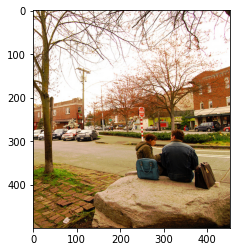

Expert Caption: ['couple are sitting on rock in front of street', 'man and woman sit on rock beside street', 'two people sit on large rock near city street', 'two people sitting on rock in city park', 'two people talk while sitting on big rock']
Blue score 2.2250738585072626e-308
caption: man sits on the edge of green lawn


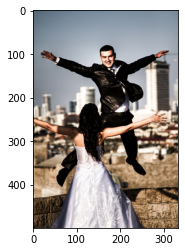

Expert Caption: ['bride and groom jump towards each other with arms outstretched', 'groom leaps off of stone wall and into his wife arms', 'man in suit leaps toward his bride', 'man in tuxedo jumps toward woman in wedding dress', 'man in wetsuit jumps towards wet bride']
Blue score 0.11111111111111109
caption: man in black shirt and jeans is standing on snowboard


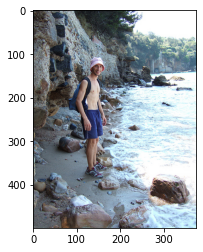

Expert Caption: ['man stands at the edge of the water near the rocks', 'shirtless man in pink hat is standing on rocky shore', 'shirtless man in pink hat stands on rocky shore', 'shirtless man with backpack and hat is standing on rocky shoreline', 'the man in shorts and hat is standing in the bay beside the ocean']
Blue score 0.375
caption: two people are standing on rocks near the ocean


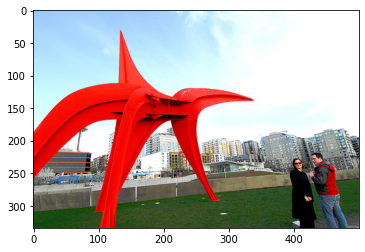

Expert Caption: ['couple looking at red sculpture', 'man and woman looking at red sculpture', 'man and woman look back at the camera while standing in front of red art structure', 'man and woman stand in front of large red modern statue', 'man and woman stand near large red sculpture outdoors']
Blue score 2.2250738585072626e-308
caption: young girl in pink shirt and jean flip flops in field


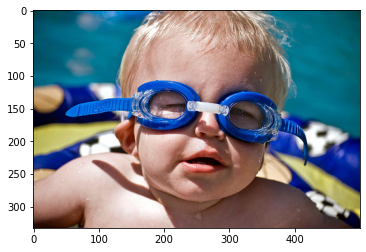

Expert Caption: ['child wearing swim goggles', 'small child wears goggles near pool', 'young child is wearing blue goggles and sitting in float in pool', 'young child wearing blue goggles sits on raft in swimming pool', 'the little child is wearing blue goggles']
Blue score 0.12500000000000003
caption: young boy wearing blue shirt and goggles is smiling


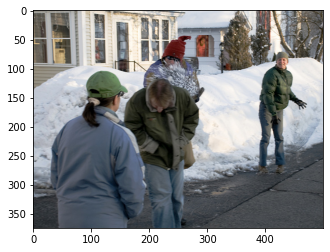

Expert Caption: ['person has just thrown snowball and hit someone in the back', 'people outside house in snow', 'people stand outside house', 'several people standing in front of pile of snow in front of house with one person shoveling', 'some people are gathered by mound of snow outside house']
Blue score 0.2222222222222222
caption: two men in coats stand in front of snowy mountain


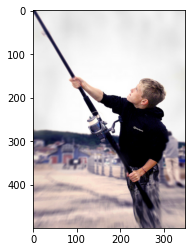

Expert Caption: ['blond boy in dark hoodie is holding fishing rod', 'boy on the beach casts fishing pole in the water', 'little boy is holding fishing rod', 'young boy wearing black hoodie is holding fishing pole', 'young male holding fishing pole']
Blue score 2.2250738585072626e-308
caption: man in shorts and black shorts is doing jump


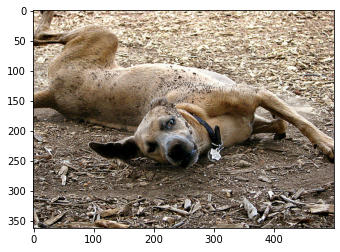

Expert Caption: ['dirty tan dog rolling in the dirt and looking right at the camera', 'dog lies on the ground', 'dog rolls on the ground', 'dog with black collar rolling in dirt and dried leaves', 'the brown dog is rolling around in the dirt']
Blue score 0.3
caption: dog is digging on the ground with stick in its mouth


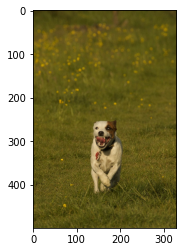

Expert Caption: ['brown and white dog is running with its mouth open accross field', 'brown and white dog running in field covered in yellow flowers', 'dog running toward the camera in field', 'while dog with spot on his eye running through meadow', 'white dog with brown patch over his eye runs through grassy field covered in dandelions']
Blue score 0.16758001150890983
caption: dog runs through the grass


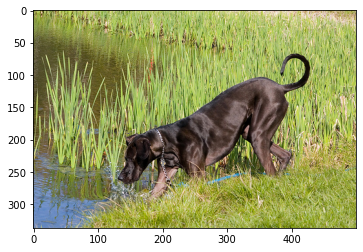

Expert Caption: ['brown dog wading into marshy pond', 'dog on the edge of body of water', 'dog walking into lake with reeds in the background', 'dog wearing blue leash walks into body of water', 'large brown dog leans into the water from the grassy shore']
Blue score 0.16666666666666669
caption: brown dog is running through the grass


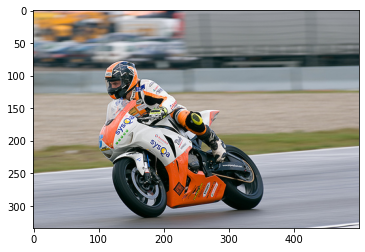

Expert Caption: ['man racing an orange motorcycle', 'man riding an orange and white motorcycle', 'motorcyclist races around track', 'an orange and white motorcycle is being ridden on racetrack', 'someone is driving an orange motorbike along pavement']
Blue score 2.2250738585072626e-308
caption: motorcycle racer is leaning on his bike


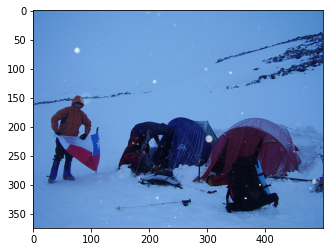

Expert Caption: ['man holds flag next to snowbound campsite', 'man with texas flag stands in the snow by tents', 'person setting up tent beside few other tents on the snowy ground', 'mountain climbers are setting up their tents', 'with pack and ski pole on the ground man wearing winter coat is holding tent while other tents are already set up']
Blue score 2.2250738585072626e-308
caption: four people are standing on snowy ridge


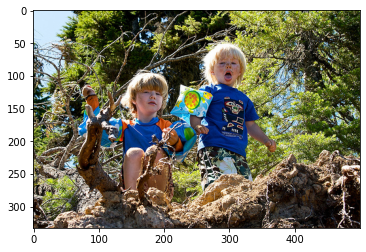

Expert Caption: ['there are two kids in swimmies playing outside next to some trees', 'two boys with long blond hair are climbing on hillside', 'two boys with water wings climb tree', 'two children posing for picture wearing water wings and sitting on rock', 'two little boys are sitting on clump of dirt']
Blue score 2.2250738585072626e-308
caption: three people are riding on dirt bikes down the rapids


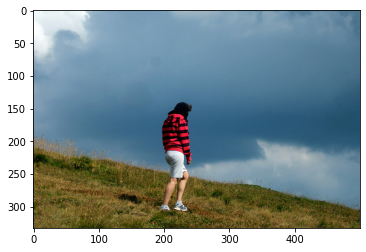

Expert Caption: ['person in red striped hooded sweatshirt and jeans shorts walking on grassy hill', 'person wearing striped shirt is walking on hill', 'woman in striped sweater is standing on hill', 'woman walking across hill with dark clouds in the background', 'one person with pink and black striped shirt and white shorts walking up hill']
Blue score 0.2222222222222222
caption: man in red shirt and red shorts stands on the beach with green and yellow pole in the background


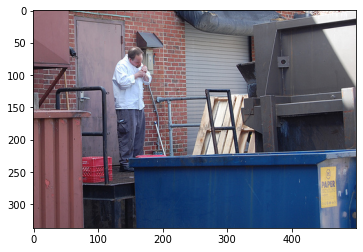

Expert Caption: ['man in white restaraunt shirt smokes next to dumpster', 'man is lighting smoke outside of building', 'man lighting cigarette near dumpster in an ally', 'man lights cigarette on loading dock near dumpster', 'the man is lighting cigarette outside the back of building']
Blue score 0.18181818181818182
caption: man in blue shirt is standing next to woman in blue shirt


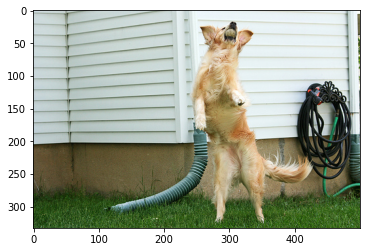

Expert Caption: ['dog catching ball', 'dog jumping up in the air next to white house', 'white dog is standing on its hind legs with ball in its mouth', 'yellow dog stands on his hind legs', 'yellow dog stands on hind legs with ball in mouth building in background']
Blue score 0.3333333333333333
caption: dog is jumping up to catch frisbee


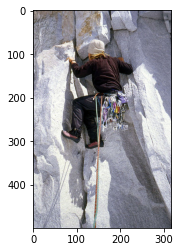

Expert Caption: ['girl is climbing rock wall', 'person climbs steep mountain', 'person wearing white hat climbs rock', 'rock climber ascends', 'someone climbs rocks']
Blue score 2.2250738585072626e-308
caption: man in black and black is walking past wooden fence


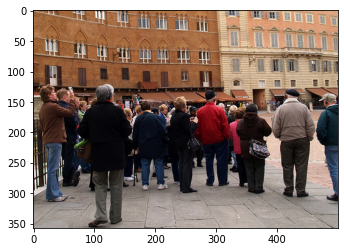

Expert Caption: ['crowd of people are standing in front of italian style buildings', 'crowd of people stand looking at somthing in european courtyard', 'crowd of people stands attentively in plaza with buildings in the background', 'group of people are looking at the buildings', 'group of people standing in the town square looking up']
Blue score 0.5714285714285714
caption: group of people are standing outside of building


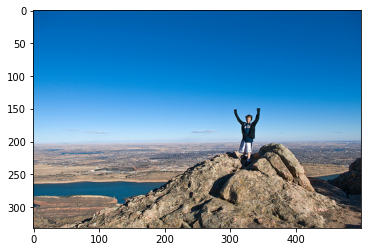

Expert Caption: ['man stands atop mountain with arms extended', 'person on top of mountain with arms over head', 'person stands at the top of mountain and raises his arms', 'man on top of mountain with his arms in the air', 'the man is standing on the rocks above the river with his arms in the air']
Blue score 0.12500000000000003
caption: man is jumping off of cliff into the ocean


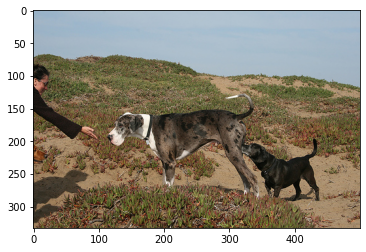

Expert Caption: ['large dog sniffing human hand while small dog is sniffing the large dog butt', 'person reaches for large grey dog while black dog trails', 'smaller dog sniffs larger dog in the hills', 'the black dog is sniffing the brown dog butt', 'the lady ask the dog to give her the ball on their beach walk']
Blue score 0.14447964995836363
caption: two dogs are playing in the dirt


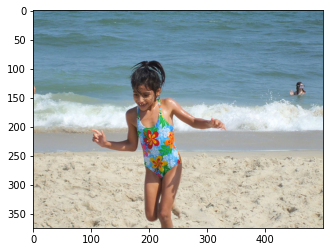

Expert Caption: ['girl smiles as she runs across the white sandy beach in her swimsuit', 'little girl in flowered bathingsuit runs through the sand at the beach', 'little girl in flower swimsuit running across the beach with waves in the background', 'there is little girl running on the beach', 'the young girl is running on sandy beach']
Blue score 0.2222222222222222
caption: young boy in swim trunks is standing on the beach


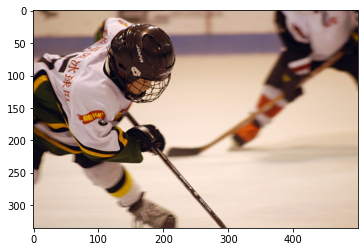

Expert Caption: ['child is playing ice hockey', 'young hockey player playing in the ice rink', 'youth playing hockey', 'the hockey player is skating on the ice smacking the puck', 'two people are playing ice hockey']
Blue score 2.2250738585072626e-308
caption: the man is wearing white helmet and white helmet


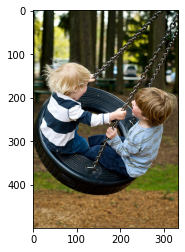

Expert Caption: ['two children are playing on swing made out of tire', 'two children swing around in tire swing at park', 'two children swinging on tire swing', 'two small children happily playing on tire swing', 'two small children wearing blue jeans enjoy swinging in tire swing']
Blue score 0.4
caption: the boy is swinging on swing


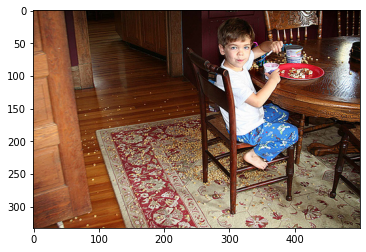

Expert Caption: ['boy eating at table', 'young boy in pajamas eats out of red bowl at wood table', 'young boy making big mess on the floor and table while eating cereal', 'young boy sits at table and eats as food is spilled all around', 'the boy in blue and white pajamas is sitting at the table eating']
Blue score 0.16666666666666669
caption: two children are playing on the carpet


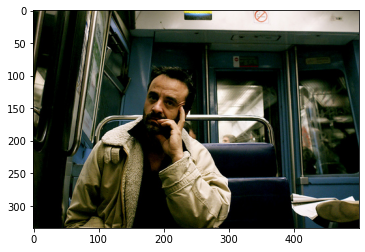

Expert Caption: ['bearded man on train', 'man is sitting on train resting his hand against his face', 'man sitting on subway', 'man sitting on subway looking at the camera', 'man sitting on public transportation']
Blue score 0.25
caption: man with glasses and beard stares at the camera


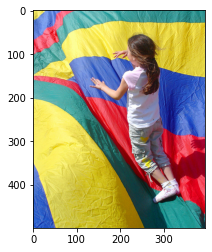

Expert Caption: ['girl bouncing on colorful sheet', 'girl in bounce house', 'girl playing on parachute', 'the little girl is playing with her shoes off', 'this girl is playing on an object which is yellow green red and blue']
Blue score 2.2250738585072626e-308
caption: little boy in red shirt is jumping on red inflatable


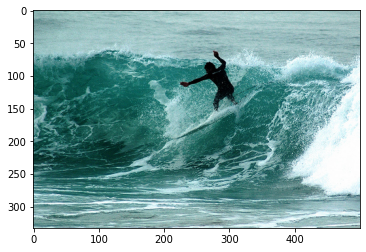

Expert Caption: ['person rides the waves on surfboard', 'person surfing', 'surfer is riding wave', 'surfer riding large wave', 'surfer riding surfboard in rough seas']
Blue score 2.2250738585072626e-308
caption: surfer rides wave


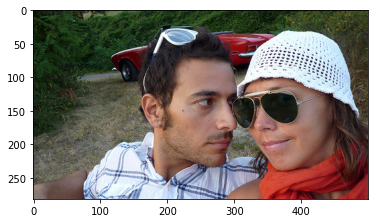

Expert Caption: ['couple practice different ways to wear sunglasses in front of red car', 'girl and boy with sunglasses and red car behind them', 'man with sunglasses and woman with hat are in front of car', 'man with sunglasses on his head is looking at the woman with white hat and red scarf next to him whilst standing in front of red sports car', 'woman in crochet hat and sunglasses smiles while the man beside her in plaid short and sunglasses looks behind her']
Blue score 0.0909090909090909
caption: young boy wearing blue shirt and blue shirt looks at the camera


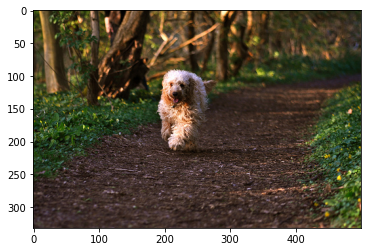

Expert Caption: ['dog runs along forest lane', 'pale dog is running along dirt path', 'shaggy dog runs down dirt trail in lush forest', 'white and brown shaggy dog is running down dirt path in park', 'the curly haired white dog is running down wooded path']
Blue score 0.25
caption: dog runs through the woods


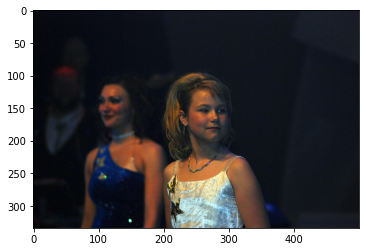

Expert Caption: ['girl in white dress walks next to girl in blue dress', 'woman in white dress and woman in blue dress onstage', 'young girl with makeup and jewelry smiles', 'blonde girl in white top with stars standing beside brunette woman in blue top with stars', 'two teenage girls are wearing fancy dresses at an event']
Blue score 0.11185491460179624
caption: man and woman are sitting in front of statue


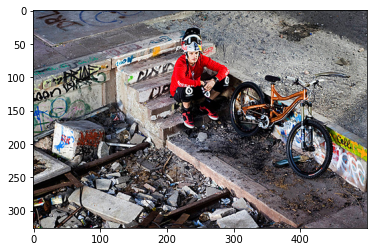

Expert Caption: ['cyclist sits on some steps with his bike', 'helmeted man sits on steps with graffiti on them and bike nearby', 'man sits on the stairs next to his bike', 'man with his bike amid demolished building', 'man with bike sitting next to rubble']
Blue score 0.11111111111111109
caption: man in green shirt is riding bike on the sidewalk


In [72]:
for z in range(100):
  pic = list(encoding_test.keys())[z]
  image = encoding_test[pic].reshape((1,2048))
  x=plt.imread(images+pic)
  plt.imshow(x)
  plt.show()
  img_caption = greedySearch(image)
  bleu_score = get_bleuscore(img_caption,pic)
  #print("image name",pic)
  print("Blue score",bleu_score)
  print("caption:", img_caption)

In [ ]:
for z in range(100):
  pic = list(encoding_test.keys())[z]
  image = encoding_test[pic].reshape((1,2048))
  x=plt.imread(images+pic)
  plt.imshow(x)
  plt.show()
  print("Greedy:",greedySearch(image))